# 03 Esri and Catalyst Workflow

Ryan E Lima [](https://orcid.org/0000-0002-5352-7215)

### 1. Import DEM into ArcGIS Pro (1m resolution, Lidar-derived) = `DEM_Raw`

***Study Area***

`USGS_1M_12_x50y381_AZ_USFS_3DEP_Processing_2019_D20.tif` = `DEM_raw`

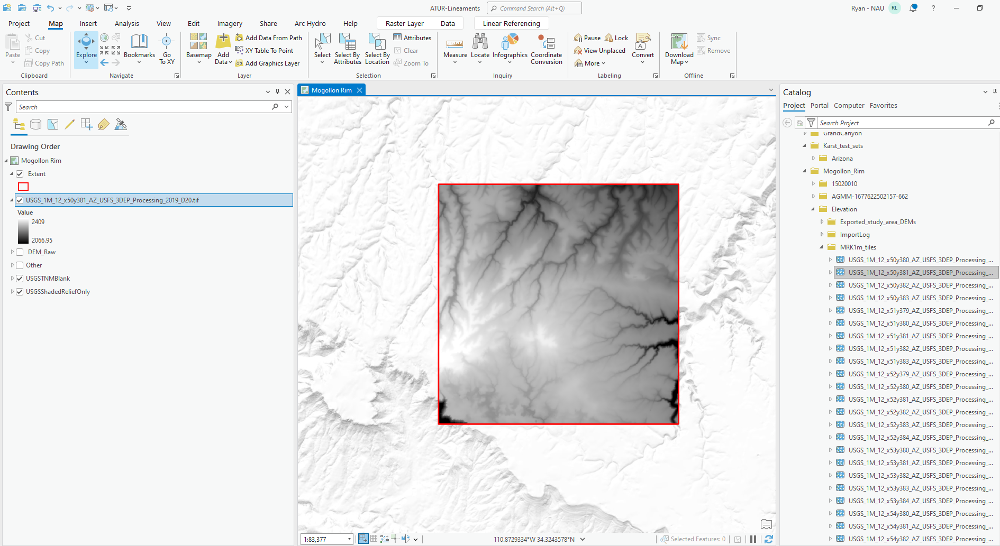

### 2. use ‘Focal Statistics’ to calculate the mean raster using a circular window and a 20m window = `MeanC20`

**Calculate Topographic Position Index**

-   `C` refers to the Circular window used in focal statistics
-   `20` is the window size in cells (\*also meters in this case)

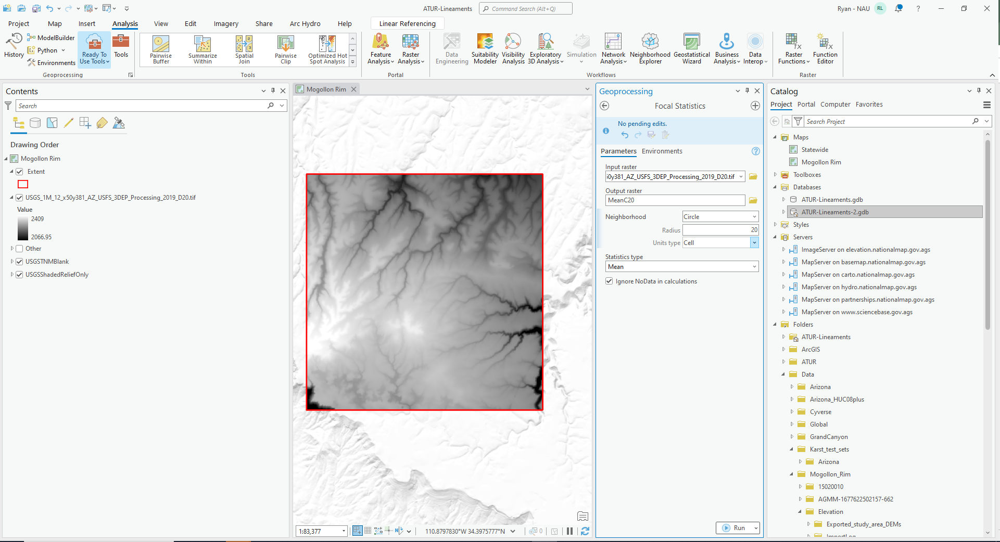

### 3. Calculate TPI or topographic position index using `Raster Calculator` by subtracting the Mean raster from the DEM_Raw

`TPI_C20 = DEM_Raw - MeanC20`

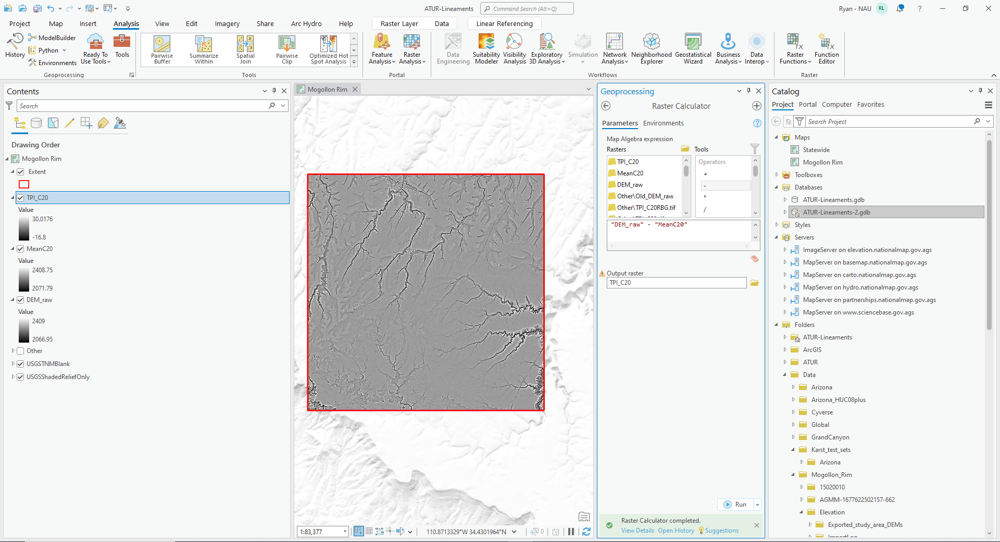

### 4. Export the TPI raster as a RGB .TIFF

-   Make sure the Symbology for the TPI_C20 is Stretch, and the stretch type is `Histogram Equalize`

-   Right click on `TPI_C20` \> Data \> Export Raster

    > Do Not Force RGB

    > All other defaults should be good

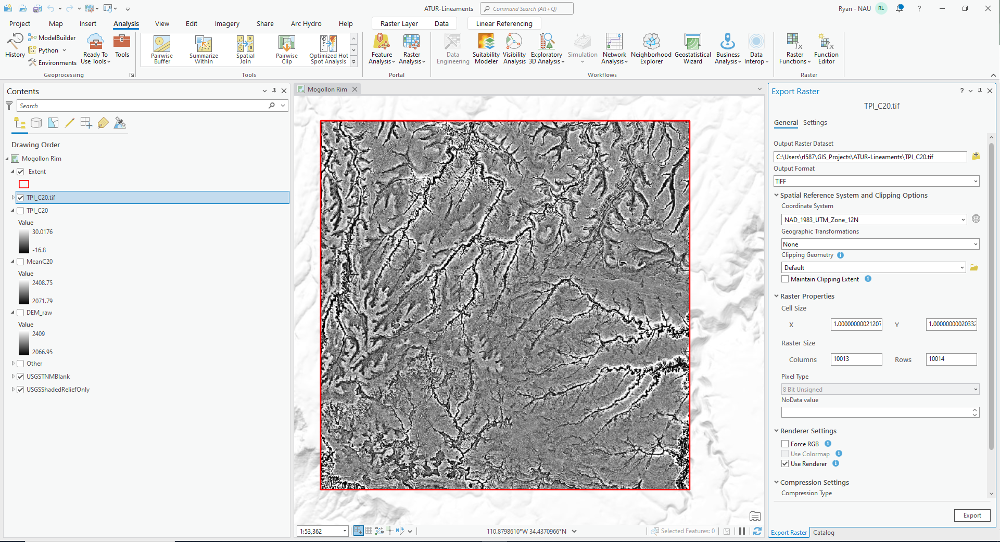

### 5. Import the TPI raster to Catalyst - Focus Module

**Extract Lineaments**

> Select the TPI image, then go to `tools` \> `Algorithm Librarian` \> `LINE`

> Use the Following Paramters:

> **RADI:** Filter Radius = 15 pixels

> **GTHR:** Edge Gradient Threshold 75 brightness 0-255

> **FTHR:** Line Fitting Threshold 2 pixels

> **LTHR:** Curve Length Threshold 45 pixels

> **ATHR:** Angular Difference Threshold 20 degrees

> **DTHR:** Linking Distance Threshold 25 pixels

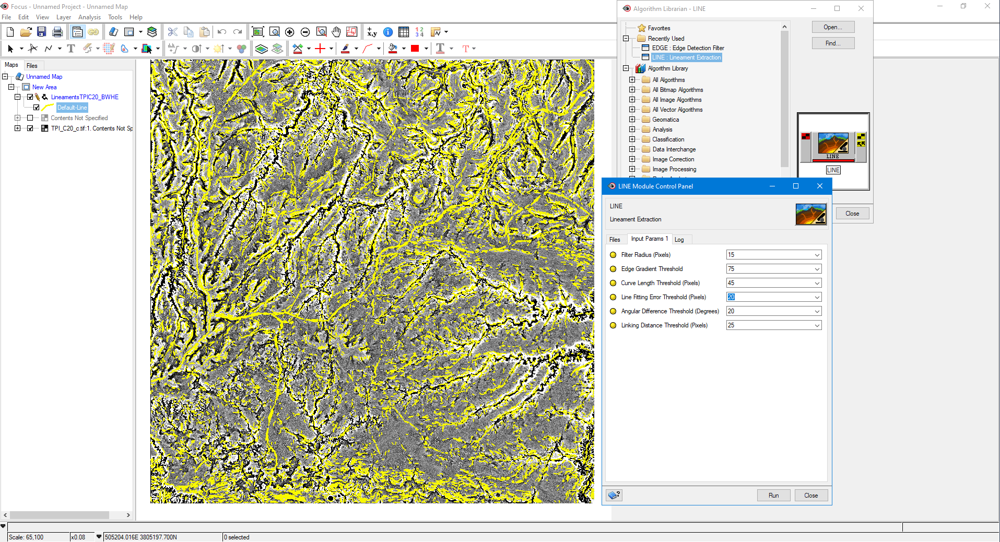

### 6. Export the lineaments Shapefile from Catalyst

-   Click on the Lineament you just created in the Maps pane, Click `Save As`, specify a location for the output

    > My file location and name: `C:\Users\rl587\GIS_Projects\ATUR-Lineaments\TPI_C20_LineamentsPCI.shp`

    > Format : ArcView Shapefile (.shp)

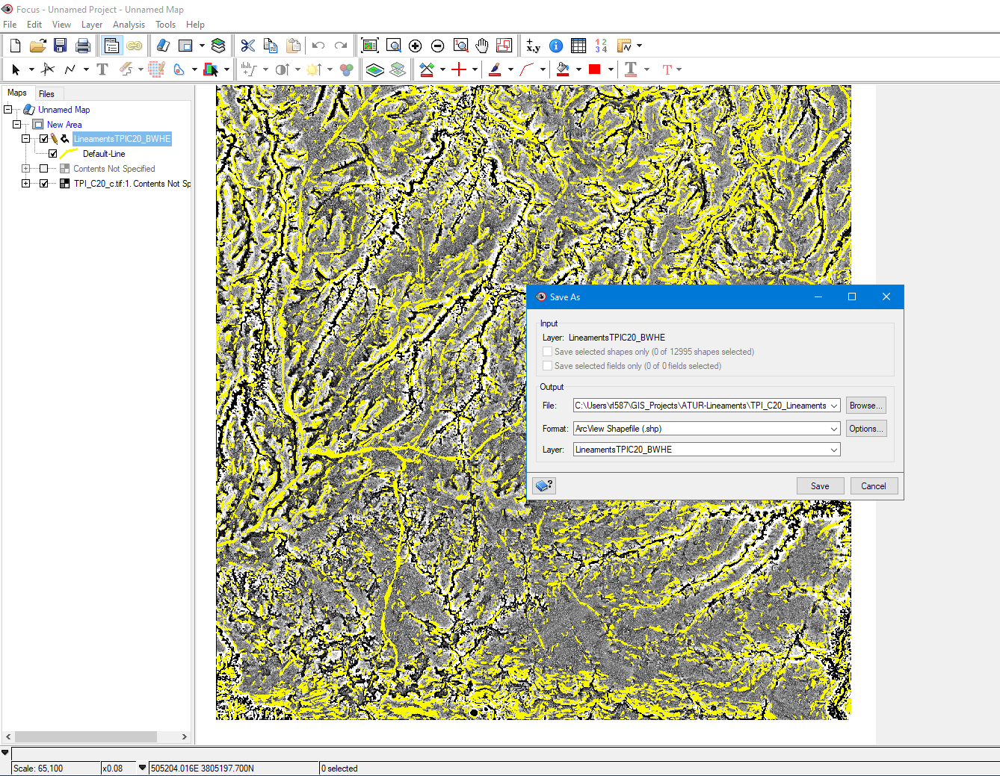

## Create a Roads and streams buffer, remove lineaments within Buffer

### 7. Open the Lineaments shapefile in ArcGIS Pro

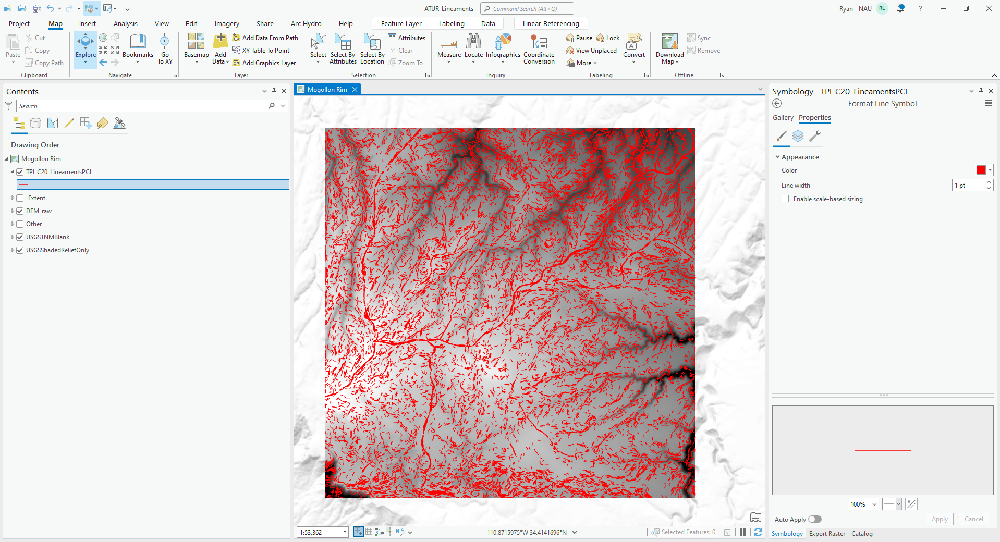

Roads are man-made lineaments and streams while they create natural lineaments we are more interested with the shape and orientation of the valley they are in rather than the stream channel itself, creating a buffer around them will allow the valley shape and orientation to be captured without creating an issue where drainage density is too positively correlated with lineament density since we want those two variables to capture different things.

> Roads layers were taken from the National Mamp - MapServer: carto.nationalmap.gov.ags \> transportation \> Large and Medium Scale \> Features \> layers = Closed Roads, 4WD Roads, Local Roads}

> All road layers clipped to study area and merged = `Roads_all`

> Stream channels taken from NHD flowlines large-scale, clipped to Study area = `Flowlines`

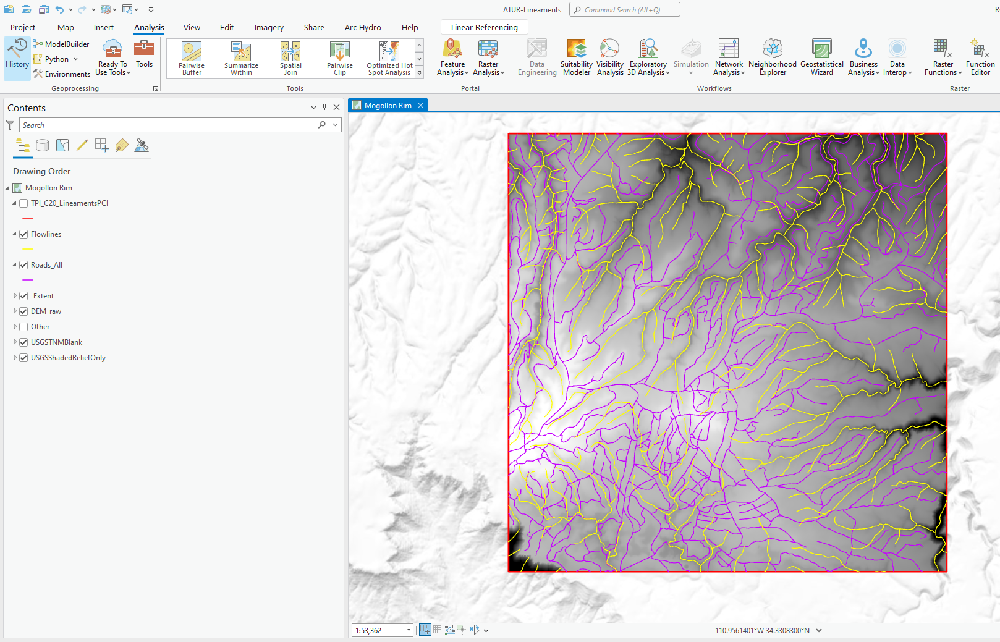

### 8. 15m buffer applied to `Flowlines` = `Stream_buffer15`

> use `Pairwise Buffer` tool
>
> ***Tool Paramters***

> -   Input Features: `Flowlines`

> -   Output Feature Class: `FlowlinesBuff15`

> -   Distance (value or field) : `Linear Unit`

> -   `15` and `Meters`

> -   Method: `Planar`

> -   Dissolve Type: `Dissolve all output features into a single feature`

### 9. 15m buffer applied to `Roads_all` = `Roads_buffer15`

> Repeat steps above for Roads, same parameters

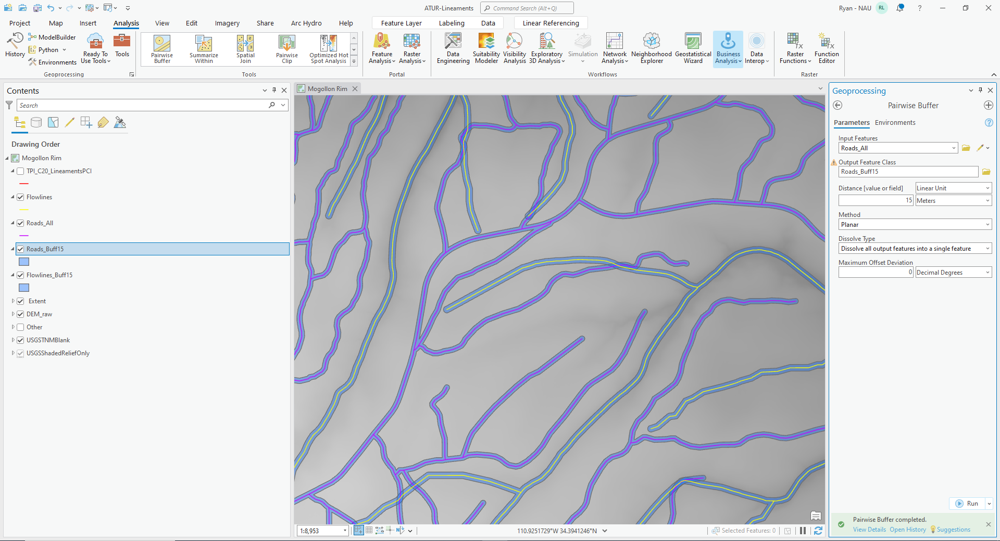

### 10. Merge Buffers

-   Use the Merge tool to merge `Stream_buffer15` and `Roads_buffer_15` = `Exclude_lineaments_buff15`

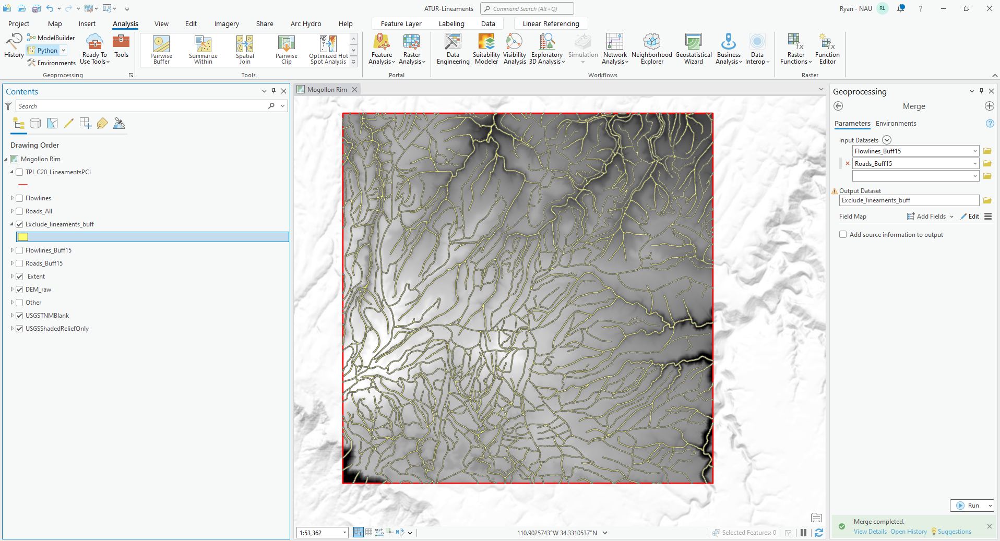

### 11. Select lineaments within buffers

-   Used select by Location, `TPI_C20_LineamentsPCI` intersecting with `Exclude_lineaments_buff15`

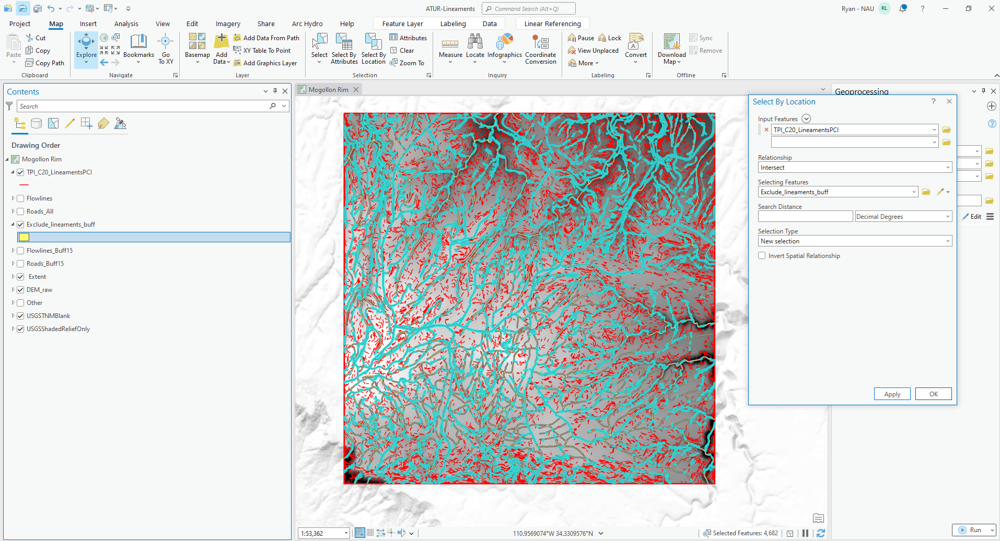

### 12. Delete Lineaements within buffers

-   Open attribute table and `delete selected`

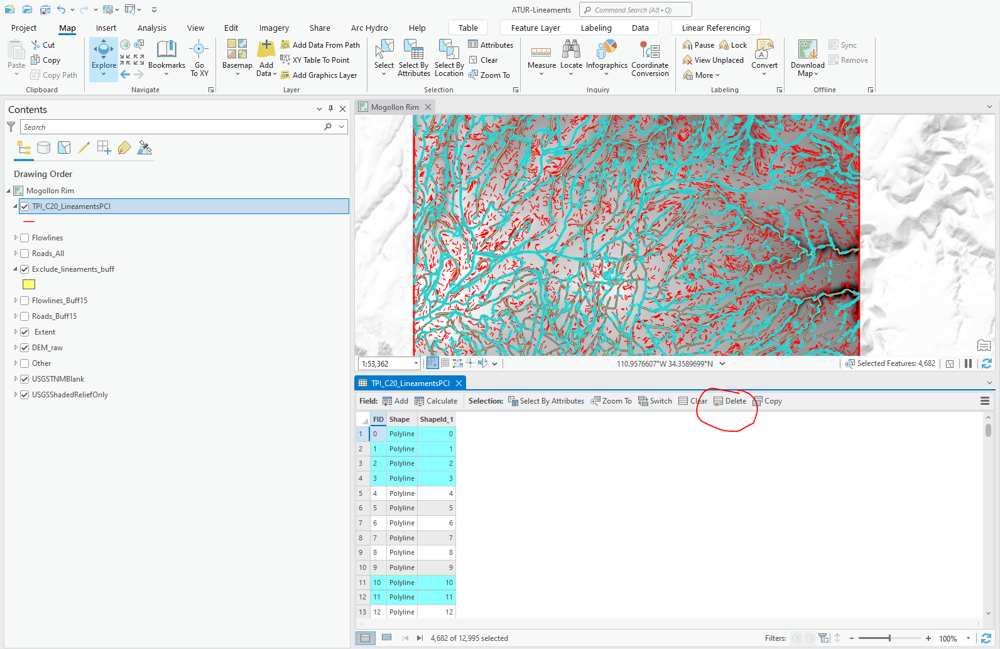

### 13. Finished Result:

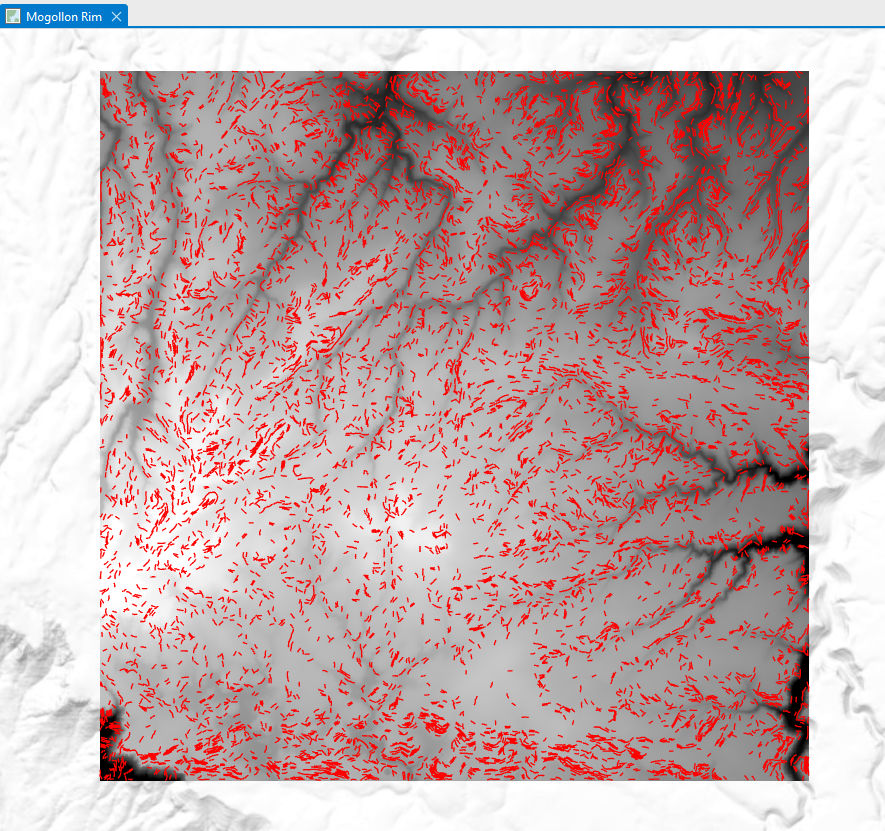

## To Do List

-   Test in Lake Mary area
-   Test on another study area
-   create esri functions for buffer
-   Paramterize buffer
-   Justify buffer
-   Justify using TPI
-   Attempt to paramterize TPI in Python
-   Attempt to improve on LINE algorithm in Python